In [1]:
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib notebook
import seaborn as sns
import statsmodels.api as sm
import statsmodels.formula.api as smf
from scipy.special import expit
from pybaseball import statcast

In [29]:
data = statcast(start_dt='2016-04-01', end_dt='2021-05-17')
data = data[data.launch_speed>0]
data.to_csv("data.csv")

This is a large query, it may take a moment to complete
Completed sub-query from 2016-04-01 to 2016-04-06
Completed sub-query from 2016-04-07 to 2016-04-12
Completed sub-query from 2016-04-13 to 2016-04-18
Completed sub-query from 2016-04-19 to 2016-04-24
Completed sub-query from 2016-04-25 to 2016-04-30
Completed sub-query from 2016-05-01 to 2016-05-06
Completed sub-query from 2016-05-07 to 2016-05-12
Completed sub-query from 2016-05-13 to 2016-05-18
Completed sub-query from 2016-05-19 to 2016-05-24
Completed sub-query from 2016-05-25 to 2016-05-30
Completed sub-query from 2016-05-31 to 2016-06-05
Completed sub-query from 2016-06-06 to 2016-06-11
Completed sub-query from 2016-06-12 to 2016-06-17
Completed sub-query from 2016-06-18 to 2016-06-23
Completed sub-query from 2016-06-24 to 2016-06-29
Completed sub-query from 2016-06-30 to 2016-07-05
Completed sub-query from 2016-07-06 to 2016-07-11
Completed sub-query from 2016-07-12 to 2016-07-17
Completed sub-query from 2016-07-18 to 2016-

Completed sub-query from 2019-06-14 to 2019-06-19
Completed sub-query from 2019-06-20 to 2019-06-25
Completed sub-query from 2019-06-26 to 2019-07-01
Completed sub-query from 2019-07-02 to 2019-07-07
Completed sub-query from 2019-07-08 to 2019-07-13
Completed sub-query from 2019-07-14 to 2019-07-19
Completed sub-query from 2019-07-20 to 2019-07-25
Completed sub-query from 2019-07-26 to 2019-07-31
Completed sub-query from 2019-08-01 to 2019-08-06
Completed sub-query from 2019-08-07 to 2019-08-12
Completed sub-query from 2019-08-13 to 2019-08-18
Completed sub-query from 2019-08-19 to 2019-08-24
Completed sub-query from 2019-08-25 to 2019-08-30
Completed sub-query from 2019-08-31 to 2019-09-05
Completed sub-query from 2019-09-06 to 2019-09-11
Completed sub-query from 2019-09-12 to 2019-09-17
Completed sub-query from 2019-09-18 to 2019-09-23
Completed sub-query from 2019-09-24 to 2019-09-29
Completed sub-query from 2019-09-30 to 2019-10-05
Completed sub-query from 2019-10-06 to 2019-10-11


In [2]:
all_data = pd.read_csv('data.csv')

/Users/sam/opt/anaconda3/lib/python3.8/site-packages/IPython/core/interactiveshell.py:3146: DtypeWarning: Columns (45) have mixed types.Specify dtype option on import or set low_memory=False.
  has_raised = await self.run_ast_nodes(code_ast.body, cell_name,


In [3]:
all_data_filtered= all_data[all_data.description != 'foul']
launch_data = pd.DataFrame(all_data_filtered, columns=['pitch_type','release_speed','launch_speed','launch_angle','hit_distance_sc','release_spin_rate','release_extension','game_year'])

In [11]:
launch_data.loc[(launch_data['pitch_type'] == 'FF') | (launch_data['pitch_type'] == 'FC') | (launch_data['pitch_type'] == 'SI') | (launch_data['pitch_type'] == 'FT'), 'fastball_dummy'] = 1
launch_data.loc[(launch_data['pitch_type'] == 'SL') | (launch_data['pitch_type'] == 'CU') | (launch_data['pitch_type'] == 'CH') | (launch_data['pitch_type'] == 'KC') | (launch_data['pitch_type'] == 'FS') | (launch_data['pitch_type'] == 'FA') | (launch_data['pitch_type'] == 'EP') | (launch_data['pitch_type'] == 'KN') | (launch_data['pitch_type'] == 'SC') | (launch_data['pitch_type'] == 'CS') | (launch_data['pitch_type'] == 'FO') | (launch_data['pitch_type'] == 'PO'), 'fastball_dummy'] = 0

In [13]:
hit_distance_formula = "hit_distance_sc ~ release_speed + launch_speed + launch_angle + release_spin_rate + release_extension + fastball_dummy"  
hit_distance_model=smf.ols(formula = hit_distance_formula, data = launch_data).fit()
hit_distance_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:        hit_distance_sc   R-squared:                       0.565
Model:                            OLS   Adj. R-squared:                  0.565
Method:                 Least Squares   F-statistic:                 1.135e+05
Date:                Tue, 18 May 2021   Prob (F-statistic):               0.00
Time:                        11:15:06   Log-Likelihood:            -3.1120e+06
No. Observations:              525057   AIC:                         6.224e+06
Df Residuals:                  525050   BIC:                         6.224e+06
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
=====================================================================================
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
Intercept           -64.0442      3.344    -19.152      0.000     -70.598     -57.490
release_speed        -0.2767      0.035     -7.874      0.000      -0.346      -0.208
launch_speed          2.4541      0.009    275.391      0.000       2.437       2.472
launch_angle          3.5539      0.005    718.704      0.000       3.544       3.564
release_spin_rate     0.0011      0.000      2.765      0.006       0.000       0.002
release_extension    -0.4431      0.259     -1.708      0.088      -0.951       0.065
fastball_dummy        1.4095      0.417      3.379      0.001       0.592       2.227
==============================================================================
Omnibus:                     7961.630   Durbin-Watson:                   1.996
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             8518.940
Skew:                          -0.286   Prob(JB):                         0.00
Kurtosis:                       3.250   Cond. No.                     5.99e+04
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 5.99e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

<IPython.core.display.Javascript object>


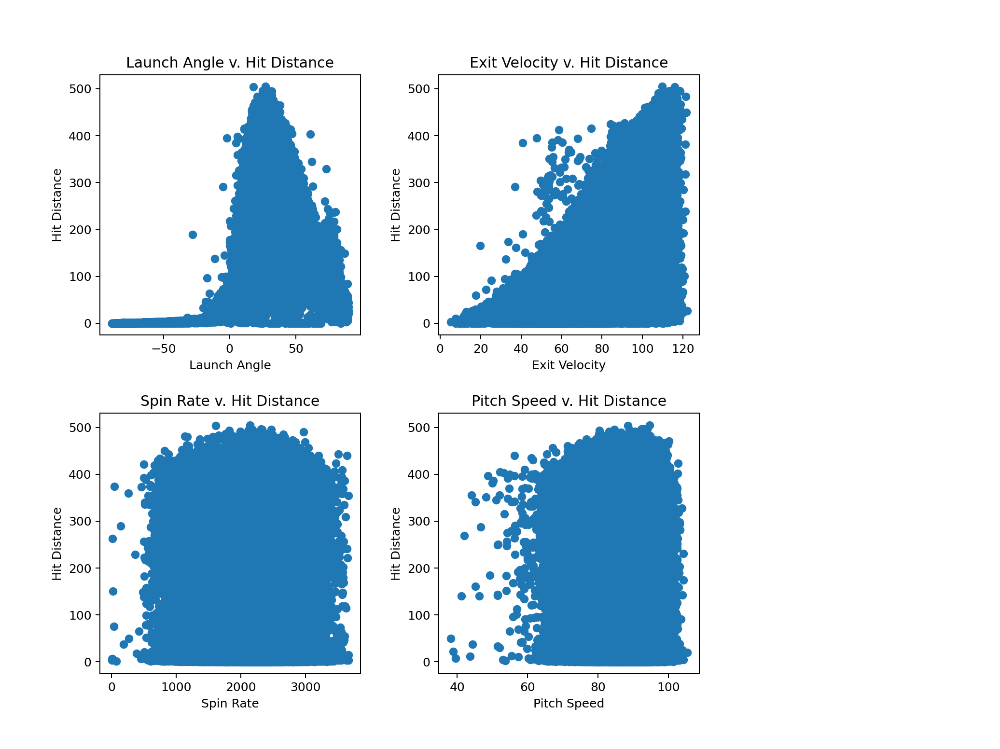

Text(0.5, 1.0, 'Launch Angle v. Hit Distance')

Text(0.5, 0, 'Launch Angle')

Text(0, 0.5, 'Hit Distance')

Text(0.5, 1.0, 'Exit Velocity v. Hit Distance')

Text(0.5, 0, 'Exit Velocity')

Text(0, 0.5, 'Hit Distance')

Text(0.5, 1.0, 'Spin Rate v. Hit Distance')

Text(0.5, 0, 'Spin Rate')

Text(0, 0.5, 'Hit Distance')

Text(0.5, 1.0, 'Pitch Speed v. Hit Distance')

Text(0.5, 0, 'Pitch Speed')

Text(0, 0.5, 'Hit Distance')

In [32]:
fig, axes = plt.subplots(2,2, sharex=False, sharey=False)
axes[0,0].scatter(launch_data.launch_angle,launch_data.hit_distance_sc)
axes[0,0].set_title('Launch Angle v. Hit Distance')
axes[0,0].set_xlabel('Launch Angle')
axes[0,0].set_ylabel('Hit Distance')
axes[0,1].scatter(launch_data.launch_speed,launch_data.hit_distance_sc)
axes[0,1].set_title('Exit Velocity v. Hit Distance')
axes[0,1].set_xlabel('Exit Velocity')
axes[0,1].set_ylabel('Hit Distance')
axes[1,0].scatter(launch_data.release_spin_rate,launch_data.hit_distance_sc)
axes[1,0].set_title('Spin Rate v. Hit Distance')
axes[1,0].set_xlabel('Spin Rate')
axes[1,0].set_ylabel('Hit Distance')
axes[1,1].scatter(launch_data.release_speed,launch_data.hit_distance_sc)
axes[1,1].set_title('Pitch Speed v. Hit Distance')
axes[1,1].set_xlabel('Pitch Speed')
axes[1,1].set_ylabel('Hit Distance')
plt.subplots_adjust(left=0.1,
                    bottom=0.1, 
                    right=0.7, 
                    top=0.9, 
                    wspace=0.3, 
                    hspace=0.3)

<IPython.core.display.Javascript object>


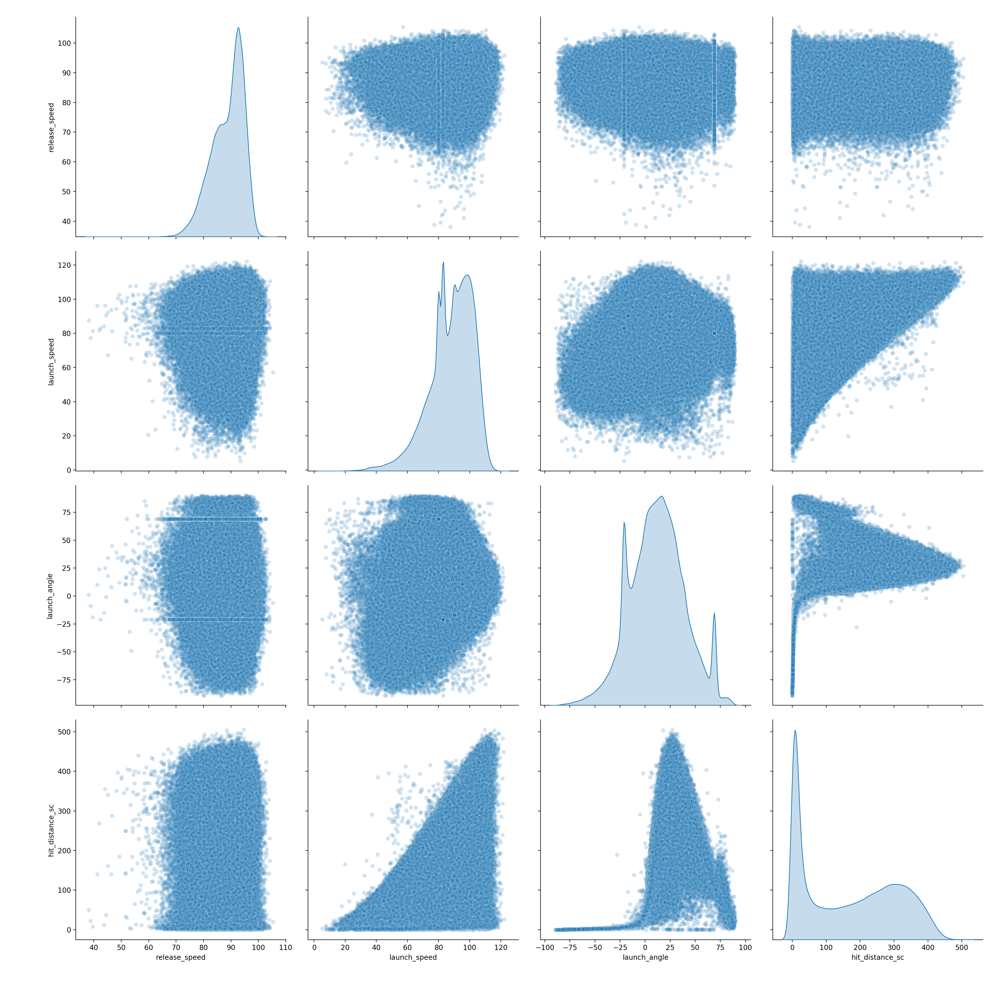

In [41]:
launch_selected_data = launch_data[['release_speed','launch_speed','launch_angle','hit_distance_sc']]
sns.pairplot(launch_selected_data, diag_kind='kde', plot_kws={'alpha':0.2})

In [35]:
residuals = hit_distance_model.resid
squared_resid = residuals**2
fitted = hit_distance_model.fittedvalues

<IPython.core.display.Javascript object>


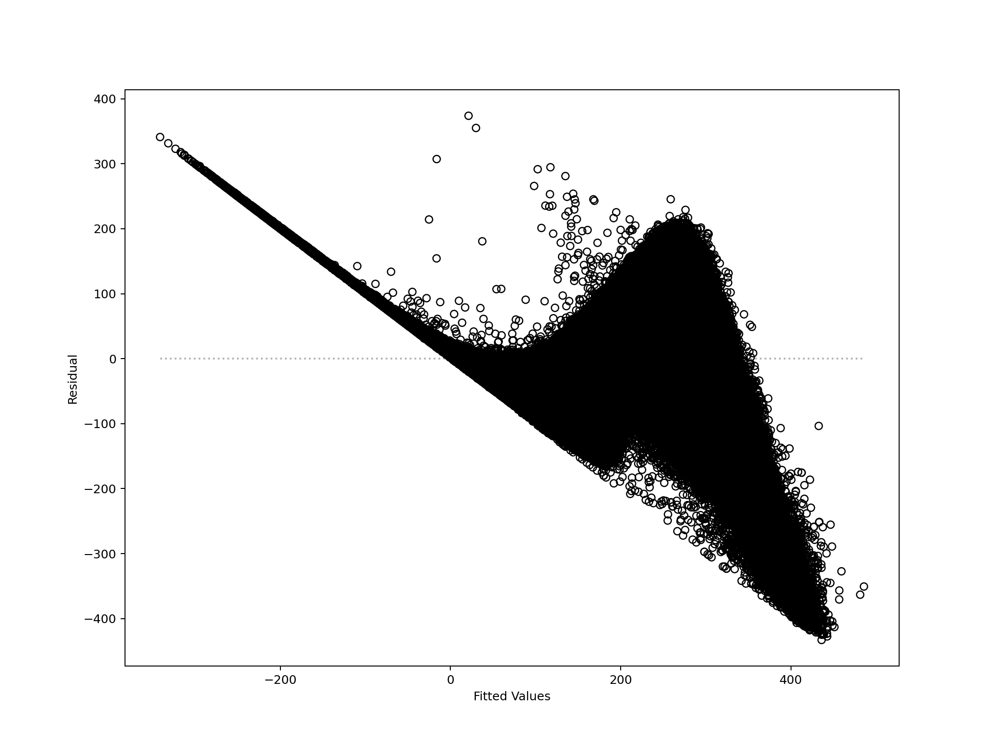

Text(0, 0.5, 'Residual')

Text(0.5, 0, 'Fitted Values')

In [39]:
fig, ax = plt.subplots()
ax.scatter(fitted, residuals, edgecolors='k', facecolors='none')
ax.set_ylabel('Residual')
ax.set_xlabel('Fitted Values')
ax.plot([min(fitted),max(fitted)],[0,0], color ="k", linestyle =":", alpha =0.3)